# Проект - Рынок заведений общественного питания Москвы

## Откроем файл с данными и изучим общую информацию

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from plotly import graph_objects as go
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster
import json

In [2]:
try:
    places = pd.read_csv('/datasets/moscow_places.csv')
except:
    places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
places.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


## Предобработка данных

In [3]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Столбец chain можно преобразовать к типу bool, т.к. значения в нём равны 0 и 1.

In [4]:
places['chain'] = places['chain'].astype('bool')

In [5]:
places.duplicated().sum() #проверка на явные дубликаты

0

Явные дубликаты отсутсвуют. Выполним проверку на неявные. Для этого приведём названия заведений к нижнему регистру. Поиску будем выполнять по одинаковому адресу и названию заведения.

In [6]:
places['name'] = places['name'].str.lower()
places[places.duplicated(subset = ['name', 'address'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,False,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,True,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,False,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,True,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,True,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,False,276.0


Найдены 6 дубликатов. Удалим их.

In [7]:
index_del = places[places.duplicated(subset = ['name', 'address'], keep = False)].index

places = places.drop(index=index_del).reset_index(drop = True)

В данных присутствует много пропусков в столбцах. Пропуски нельзя заполнить, оставим как есть.
Создадим столбец с названиями улиц.

In [8]:
places['street'] = places['address'].apply(lambda x: x.split(',')[1].strip())

Создадим столбец для определения, что заведение работает ежедневно и круглосуточно (24/7). Для этого создадим функцию.

In [9]:
def categorize_hours(hours):
    if hours == 'ежедневно, круглосуточно':
        return True
    return False 

In [10]:
places['is_24/7'] = places['hours'].apply(categorize_hours)

In [11]:
places = places.reset_index() #добавим столбец с индексом

## Анализ данных

### Анализ категории заведений

In [12]:
places_types = places.groupby(by='category').agg({'index':'count'}).sort_values(by='index', ascending=False)
places_types['%'] = round(places_types['index']/places.shape[0] * 100, 2)
places_types

,index,%
category,,
кафе,2377,28.30
ресторан,2040,24.29
кофейня,1413,16.82
"бар,паб",764,9.10
пиццерия,633,7.54
быстрое питание,603,7.18
столовая,315,3.75
булочная,255,3.04


In [13]:
fig = px.bar(places_types, title='Количество заведений по категориям', text = '%')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Количество')
fig.show() 

Наибольшее количество заведений в Москве занимают кафе(28,3%) и рестораны(24,3%). Наименее частыми являются булочные и столовые.

### Анализ количества посадочных мест по категориям заведений

In [14]:
places_seats = places.groupby(by='category').agg({'seats':'median'}).sort_values(by='seats', ascending=False)
places_seats

,seats
category,
ресторан,86.0
"бар,паб",82.0
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


In [15]:
fig = px.bar(places_seats, title='Медианное кол-во посадочных мест по категориям')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Количество')
fig.show() 

Наибольшее кол-во посадочных мест в ресторанах(86) и пабах(82). Наименьшее в булочных - 50.

### Соотношение сетевых и несетевых заведений

In [16]:
places_chain = places.groupby(by='chain').agg({'index':'count'})
places_chain

,index
chain,
False,5198
True,3202


In [17]:
fig = go.Figure(data=[go.Pie(labels=places_chain.index, values=places_chain['index'])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений')
fig.show() 

61.9% несетевых заведений к 38.1% сетевых.

### Анализ категории заведений являющихся сетевыми

In [18]:
chain_report = places.pivot_table(index= 'category', columns = 'chain', values = 'index', aggfunc = 'count')
chain_report.columns = ['несетевые', 'сетевые']
chain_report['%_сетевых'] = chain_report['сетевые']/(chain_report['сетевые'] + chain_report['несетевые'])*100
chain_report['%_несетевых'] = 100 - chain_report['%_сетевых']
chain_report

,несетевые,сетевые,%_сетевых,%_несетевых
category,,,,
"бар,паб",596,168,21.989529,78.010471
булочная,99,156,61.176471,38.823529
быстрое питание,371,232,38.474295,61.525705
кафе,1598,779,32.772402,67.227598
кофейня,693,720,50.955414,49.044586
пиццерия,303,330,52.132701,47.867299
ресторан,1311,729,35.735294,64.264706
столовая,227,88,27.936508,72.063492


In [19]:
chain_report = chain_report.drop(columns=['несетевые', 'сетевые']).sort_values(by='%_сетевых', ascending=False)
chain_report

,%_сетевых,%_несетевых
category,,
булочная,61.176471,38.823529
пиццерия,52.132701,47.867299
кофейня,50.955414,49.044586
быстрое питание,38.474295,61.525705
ресторан,35.735294,64.264706
кафе,32.772402,67.227598
столовая,27.936508,72.063492
"бар,паб",21.989529,78.010471


In [20]:
fig = px.bar(chain_report, title='Распределение сетевых и несетевых заведений по категории')
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Процент')
fig.show()

Чаще всего сетевыми бывают булочные, кофейни и пиццерии. Бары редко бывают сетевыми.

### Топ 15 сетевых заведений

In [21]:
places_chain = places.query('chain == True').groupby(by='name').agg({'index':'count'}).sort_values(by='index', ascending=False).head(15)
places_chain

,index
name,
шоколадница,120
домино'с пицца,76
додо пицца,74
one price coffee,71
яндекс лавка,69
cofix,65
prime,50
хинкальная,44
кофепорт,42


In [22]:
fig = px.bar(places_chain, title='Топ 15 сетевых заведений по количеству')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Наименование сети',
                  yaxis_title='Количество заведений')
fig.show() 

Больше всего в Москве заведений сети кофейнь "Шоколадница". Определим к каким категориям относятся данные заведения.

In [23]:
top15_names = places_chain.index
top15_names

Index(['шоколадница', 'домино'с пицца', 'додо пицца', 'one price coffee',
       'яндекс лавка', 'cofix', 'prime', 'хинкальная', 'кофепорт',
       'кулинарная лавка братьев караваевых', 'теремок', 'чайхана', 'буханка',
       'cofefest', 'му-му'],
      dtype='object', name='name')

In [24]:
top15_category = places.query('name in @top15_names').groupby(['category', 'name']).agg({'index':'count'})
top15_category

index
category        name                                      
бар,паб         му-му                                    1
                хинкальная                               3
булочная        буханка                                 25
быстрое питание му-му                                    2
                теремок                                  2
                хинкальная                               6
                чайхана                                  2
кафе            cofefest                                 1
                prime                                    1
                буханка                                  1
                кулинарная лавка братьев караваевых     39
                му-му                                   12
                хинкальная                              19
                чайхана                                 26
                шоколадница                              1
кофейня         cofefest                                31
                cofix                                   65
                one price coffee                        72
                буханка                                  6
                кофепорт                                42
                му-му                                    2
                шоколадница                            119
пиццерия        додо пицца                              74
                домино'с пицца                          77
                му-му                                    1
ресторан        prime                                   49
                му-му                                    8
                теремок                                 36
                хинкальная                              15
                чайхана                                  9
                яндекс лавка                            69
столовая        му-му                                    1
                хинкальная                               1

В данных явно есть несоответствия.

In [25]:
top15_category = places.query('name in @top15_names').groupby('category').agg({'index':'count'}).sort_values(by='index', ascending=False)
top15_category

,index
category,
кофейня,337
ресторан,186
пиццерия,152
кафе,100
булочная,25
быстрое питание,12
"бар,паб",4
столовая,2


Большинство заведений из топ 15 - кофейни.

### Анализ заведений по административным округам

In [26]:
places_district = places.pivot_table(columns ='category', index='district', values='index', aggfunc='count').reset_index(drop = False)

places_district

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,36,62,238,150,71,218,24
2,Северный административный округ,68,39,58,235,193,77,187,41
3,Северо-Восточный административный округ,62,28,82,269,159,68,181,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


In [27]:
fig = px.bar(places_district, x='district', y=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня',
                                               'пиццерия', 'ресторан', 'столовая'], title="Распределение заведений по административным округам")
fig.show()

Больше всего заведений в ЦАО. В ЦАО больше всего ресторанов. По другим округам можно увидеть, что самая популярная категория заведений - кафе. Меньше всего заведений в СЗАО.

### Анализ среднего рейтинга по категориям заведений

In [28]:
places_rating = places.groupby(by='category').agg({'rating':'mean'}).sort_values(by='rating', ascending=False)
places_rating

,rating
category,
"бар,паб",4.387696
пиццерия,4.301264
ресторан,4.290392
кофейня,4.277282
булочная,4.269020
столовая,4.211429
кафе,4.123896
быстрое питание,4.050249


In [29]:
fig = px.bar(places_rating, title='Средний рейтинг по категориям заведений', range_y=[4, 4.5])
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Средний рейтинг')
fig.show()

Усреднённые рейтинги в разных типах общепита не сильно различаются(от 4.05 до 4.38). Лучше всего оценки у баров. Возможно потому что посетители выходят с хорошим настроением и оставляют хороший отзыв. Низкие же результаты у заведений быстрого питания.

### Хороплет со средним рейтингом заведений каждого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [30]:
# для каждого округа посчитаем медианный рейтинг заведений
rating_df = places.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [31]:
# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [32]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Все заведения на карте

Отобразим все заведения датасета на карте с помощью кластеров.

In [33]:
# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m1)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m1

### Топ 15 улиц по количеству заведений

In [34]:
places_street = places.groupby(by='street').agg({'index':'count'}).sort_values(by='index', ascending=False).head(15)
places_street

,index
street,
проспект Мира,182
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


Большинство улиц - длинные проспекты или шоссе. Из них больше всего заведений на проспекте Мира.

In [35]:
top15_street = places_street.index
top15_st_category = places.query('street in @top15_street').pivot_table(columns ='category', index='street', values='index', aggfunc='count')
top15_st_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


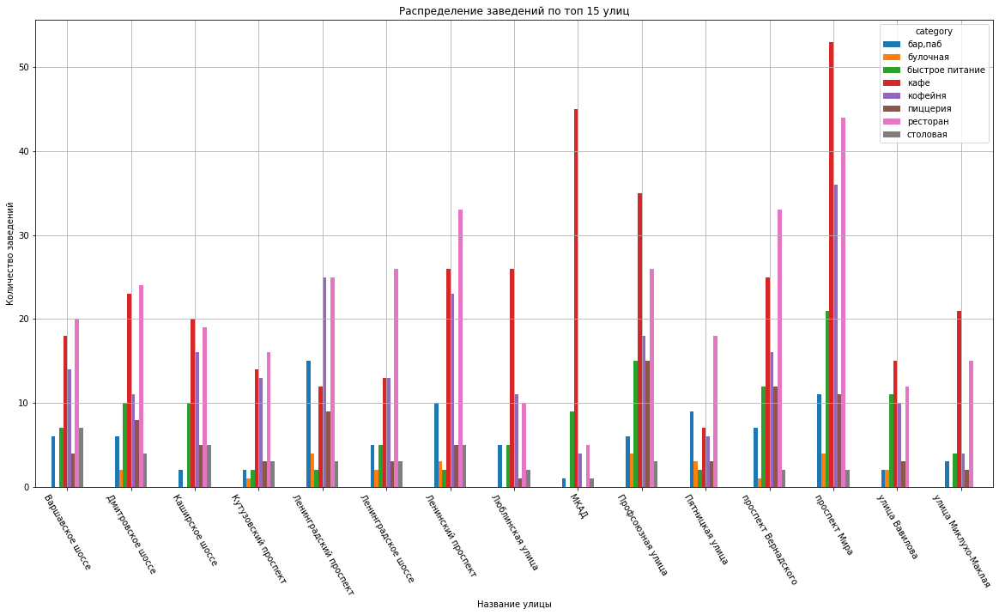

In [36]:
top15_st_category.plot(
    kind='bar', grid=True, figsize=(20, 10), title = 'Распределение заведений по топ 15 улиц')
plt.ylabel('Количество заведений')
plt.xlabel('Название улицы')
plt.xticks(rotation=-60)
plt.show()

На графике можно заметить необычные особоенности. Например, большинство заведений на МКАДе - кафе. На Ленинградском проспекте много баров по сравнению с остальными улицами. На некоторых улицах нет ни одной булочной.

### Улицы на которых находится только один объект общепита

In [37]:
places_street = places.groupby(by='street').agg({'index':'count'}).query('index == 1')
places_street1 = places_street.index

In [38]:
places_street1

Index(['1-й Автозаводский проезд', '1-й Балтийский переулок',
       '1-й Варшавский проезд', '1-й Вешняковский проезд',
       '1-й Голутвинский переулок', '1-й Грайвороновский проезд',
       '1-й Дербеневский переулок', '1-й Земельный переулок',
       '1-й Капотнинский проезд', '1-й Кирпичный переулок',
       ...
       'улица Уткина', 'улица Фадеева', 'улица Фотиевой', 'улица Чечулина',
       'улица Чистова', 'улица Шкулёва', 'улица Шкулёва 4', 'улица Шухова',
       'улица Юннатов', '№ 7'],
      dtype='object', name='street', length=458)

Получили список улиц на которых находится только одно заведение.

In [39]:
places.query('street in @places_street1').groupby(by='category').agg({'index':'count'}).sort_values(by='index', ascending=False)

,index
category,
кафе,160
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


Большинство из этих заведений - кофейни.

In [40]:
places.query('street in @places_street1').groupby(by='price').agg({'index':'count'}).sort_values(by='index', ascending=False)

,index
price,
средние,120
выше среднего,29
высокие,22
низкие,11


Большинство - средней ценовой категории.

In [41]:
places.query('street in @places_street1').groupby(by='chain').agg({'index':'count'}).sort_values(by='index', ascending=False)

,index
chain,
False,325
True,133


Большинство - не сетевые.

In [42]:
places.query('street in @places_street1').groupby(by='district').agg({'index':'count'}).sort_values(by='index', ascending=False)

,index
district,
Центральный административный округ,145
Северо-Восточный административный округ,55
Восточный административный округ,52
Северный административный округ,52
Южный административный округ,43
Юго-Восточный административный округ,39
Западный административный округ,35
Северо-Западный административный округ,19
Юго-Западный административный округ,18


Большинство из них в ЦАО. Возможно т.к. там маленькие улицы

### Хороплет со средними ценами

In [43]:
places_bill = places.groupby(by='district').agg({'middle_avg_bill':'median'}).sort_values(by='middle_avg_bill', ascending=False).head(15).reset_index()
places_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [44]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=places_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по районам',
).add_to(m2)

# выводим карту
m2

Самые дорогие заведения в ЗАО и ЦАО.

### Выводы

В Москве чаще всего встречаются кафе, рестораны и кофейни. Кол-во посадочных мест в среднем колеблется от 50 до 86. Большая часть заведений не являются сетевыми, но среди сетевых чаще всего встречаются кофейни. Больше всего заведений в ЗАО, а меньше всего в СЗАО. Средний рейтинг выше у баров, однако и другие не сильно уступают. Выше всего рейтинг заведений в СВАО, при этом и цены там одни из самых низких.  Самые дорогие районы - ЗАО и ЦАО. 

## Открытие кофейни

Сделаем срез датасета с кофейнями.

In [45]:
coffeehouse = places.query('category == "кофейня"')
coffeehouse.shape[0]

1413

1413 кофеен в датасете.

In [46]:
coffeehouse_district = coffeehouse.pivot_table(index='district', values=['index', 'street'], aggfunc='nunique').reset_index()
coffeehouse_district['count_per_street'] = coffeehouse_district['index']/coffeehouse_district['street']
coffeehouse_district.columns = ['Округ', 'Кол-во кофеен', 'Кол-во улиц', 'Число кофеен на улицу']
coffeehouse_district.sort_values(by='Кол-во кофеен', ascending=False)

,Округ,Кол-во кофеен,Кол-во улиц,Число кофеен на улицу
5,Центральный административный округ,428,210,2.038095
2,Северный административный округ,193,79,2.443038
3,Северо-Восточный административный округ,159,68,2.338235
1,Западный административный округ,150,55,2.727273
8,Южный административный округ,131,54,2.425926
0,Восточный административный округ,105,63,1.666667
7,Юго-Западный административный округ,96,38,2.526316
6,Юго-Восточный административный округ,89,44,2.022727
4,Северо-Западный административный округ,62,36,1.722222


In [47]:
fig = px.bar(coffeehouse_district,
             x = 'Округ',
             y = 'Кол-во кофеен',
             title='Распределение коффен по округам')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis={'categoryorder':'total descending'}) 
fig.show() 

Больше всего кофеен в ЦАО. Но плотность по улицам не очень высокая. Меньше всего кофеен в СЗАО. 
Построим круговую диаграмму соотношения сетевых кофеен к несетевым.

In [48]:
coffeehouse_chain = coffeehouse.groupby(by='chain').agg({'index':'count'})
fig = go.Figure(data=[go.Pie(labels=coffeehouse_chain.index, values=coffeehouse_chain['index'])])
fig.update_layout(title='Соотношение сетевых и несетевых кофеен')
fig.show()

Соотношение сетевых к несетевым почти одинаково.

In [49]:
coffeehouse_rating = coffeehouse.groupby(by='district').agg({'rating':'mean'}).sort_values(by='rating', ascending=False)
coffeehouse_rating

,rating
district,
Центральный административный округ,4.336449
Северо-Западный административный округ,4.325806
Северный административный округ,4.291710
Юго-Западный административный округ,4.283333
Восточный административный округ,4.282857
Южный административный округ,4.232824
Юго-Восточный административный округ,4.225843
Северо-Восточный административный округ,4.216981
Западный административный округ,4.195333


In [50]:
fig = px.bar(coffeehouse_rating,
             title='Рейтинг коффен по округам',
             range_y=[4.15, 4.35])
fig.update_layout(xaxis_title='Округ',
                  yaxis_title='Рейтинг')
fig.show()

Лучшие рейтинги у кофеен в ЦАО, а худшие - в ЗАО.

In [51]:
coffeehouse_price = coffeehouse.groupby(by='district').agg({'middle_coffee_cup':'median'}).sort_values(by='middle_coffee_cup', ascending=False)
coffeehouse_price

,middle_coffee_cup
district,
Юго-Западный административный округ,198.0
Центральный административный округ,190.0
Западный административный округ,189.0
Северо-Западный административный округ,165.0
Северо-Восточный административный округ,162.5
Северный административный округ,159.0
Южный административный округ,150.0
Юго-Восточный административный округ,147.5
Восточный административный округ,135.0


In [52]:
fig = px.bar(coffeehouse_price,
             title='Цена чашки кофе по округам',
             range_y=[130, 200])
fig.update_layout(xaxis_title='Округ',
                  yaxis_title='Стоимость, р')
fig.show()

In [53]:
coffeehouse['middle_coffee_cup'].median()

170.0

Самый дорогий кофе в ЮЗАО, ЦАО и ЗАО(~190 за чашку). А медианная стоимость чашки кофе в Москве равна 170р.

In [54]:
coffeehouse['seats'].median()

80.0

Медианное число посадочных мест в кофейнях - 80.

Определим процент круглосуточных кофеен.

In [55]:
coffeehouse_is_24 = coffeehouse.groupby(by='is_24/7').agg({'index':'count'})
fig = go.Figure(data=[go.Pie(labels=coffeehouse_is_24.index, values=coffeehouse_is_24['index'])])
fig.update_layout(title='Соотношение круглосуточных кофеен к обычным')
fig.show()

Только 4% процента кофеен круглосуточные.

## Итоговый вывод

В ходе исследования были пронализированы заведения общественного питания Москвы и сделаны выводы. 
Всего в Москве около 16% кофеен. Поэтому конкуренция здесь не самая высокая, но присутствует много сетевых конкурентов, таких как Шоколадница, One Price Coffee, Cofix и т.д. Хуже всего рейтинг кофеень в ЗАО(значит, конкуренты там слабее), но при этом там один из самых дорогих кофе, однако количество кофеен на улицу там и так зашкваливает. На северо-западе достаточно мало кофеен, но при это и ценник там неплохой. Поэтому основателям можно посоветовать открыть кофейню в СЗАО. Также можно подумать об открытии кофейни 24/7, т.к. таких в Москве всего лишь 4%.